# colab_08c — Remediation: Harmony `theta=4` on union HVGs

## Motivation

colab_08b restricted HVGs to the 751 genes HV in BOTH datasets, hoping to force Harmony to align on shared signal only. **It backfired**: the integration got worse (61% of cells in >95%-pure clusters vs colab_08's 41%), and the cluster-0 pathology inverted — fetal RG consolidated into a new fetal-pure cluster 5 (87.2% bhaduri_2021) while organoid RG fragmented across clusters 0/1/8/12. Same problem rotated 90°. See colab_08b's bottom summary for the full diagnostic.

Diagnosis: the 1,249 HVGs we dropped were not pure noise — they included shared cell-type signal whose variance pattern differed between datasets due to composition differences. Removing them stripped variance Harmony was using to find shared structure, leaving 751 genes whose dominant signal turned out to encode dataset-level technical artifacts. Visible as 1-iteration convergence with mean per-cell shift 0.127 (vs colab_08's 0.626).

## This notebook: `theta=4` on the original 2,000 union HVGs

Revert to colab_08's HVG selection (2,000 genes, `batch_key='dataset'`, `flavor='seurat'`), but bump Harmony's `theta` parameter from default 2 → 4. `theta` controls the strength of batch correction in Harmony's objective — higher `theta` = more aggressive mixing penalty for cells of different batches sitting in the same cluster. Default 2 was insufficient at colab_08's setting; if 4 doesn't fix it, escalate to `theta=6` or scVI.

Single-parameter change. Cheapest test of "Harmony just needs more force on the original feature space."

## Outputs

- `integrated_100k_harmony_theta4.h5ad` on Drive (separate from colab_08 / colab_08b outputs).
- §11 re-runs the cluster-0 fetal-RG diagnostic. **Pass criterion**: dominant RG cluster has substantial mixing (neither >95% organoid nor >95% fetal); fetal RG enrichment stays high (≳ 5×); cells in >95%-pure clusters drops below colab_08's 41%.

## 0. Setup

### 0a — Install dependencies, mount Drive, import packages

Installs `scanpy`, `leidenalg`, `harmonypy` (none are pre-installed on standard Colab images). Mounts Google Drive (project lives at `MyDrive/brain-organoid-trajectories`), imports the scanpy stack, and defines `PATHS` for both inputs and the integration output.

In [1]:
!pip install -q scanpy leidenalg harmonypy

from google.colab import drive
drive.mount('/content/drive')

import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import scipy.sparse as sp
import harmonypy as hm
import matplotlib.pyplot as plt

sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(6, 5))

DRIVE_ROOT = '/content/drive/MyDrive/brain-organoid-trajectories'
PATHS = {
    'bhaduri_2020_100k': os.path.join(DRIVE_ROOT, 'data/processed/bhaduri_2020/bhaduri_2020_100k.h5ad'),
    'bhaduri_2021_100k': os.path.join(DRIVE_ROOT, 'data/processed/bhaduri_2021/bhaduri_2021_100k.h5ad'),
    'integrated_out':    os.path.join(DRIVE_ROOT, 'data/processed/integrated/integrated_100k_harmony_theta4.h5ad'),
}
os.makedirs(os.path.dirname(PATHS['integrated_out']), exist_ok=True)
print('scanpy', sc.__version__, '| anndata', ad.__version__, '| harmonypy', hm.__version__)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 76.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 89.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.3/174.3 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 106.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 101.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.6/319.6 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 120.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the so

/tmp/ipykernel_16374/1484751896.py:16: FutureWarning: Use `scanpy.set_figure_params` instead
  sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(6, 5))


scanpy 1.12.1 | anndata 0.12.11 | harmonypy 2.0.0


/tmp/ipykernel_16374/1484751896.py:25: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  print('scanpy', sc.__version__, '| anndata', ad.__version__, '| harmonypy', hm.__version__)
/tmp/ipykernel_16374/1484751896.py:25: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  print('scanpy', sc.__version__, '| anndata', ad.__version__, '| harmonypy', hm.__version__)


## 1. Load both 100k subsamples

### 1a — Read both h5ads from Drive

Loads each AnnData and prints shape, raw status, and obs columns. The two datasets store counts differently — we unify in section 2.

In [2]:
adata_2020 = sc.read_h5ad(PATHS['bhaduri_2020_100k'])
adata_2021 = sc.read_h5ad(PATHS['bhaduri_2021_100k'])

print(f'Bhaduri 2020: {adata_2020.shape[0]:,} cells x {adata_2020.shape[1]:,} genes  '
      f'(raw is {"set" if adata_2020.raw is not None else "None"})')
print(f'Bhaduri 2021: {adata_2021.shape[0]:,} cells x {adata_2021.shape[1]:,} genes  '
      f'(raw is {"set" if adata_2021.raw is not None else "None"})')
print()
print('Bhaduri 2020 obs cols:', list(adata_2020.obs.columns))
print('Bhaduri 2021 obs cols:', list(adata_2021.obs.columns))

Bhaduri 2020: 100,000 cells x 16,774 genes  (raw is set)
Bhaduri 2021: 100,000 cells x 33,694 genes  (raw is None)

Bhaduri 2020 obs cols: ['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'sample', 'leiden', 'protocol', 'age_week']
Bhaduri 2021 obs cols: ['source_tarball', 'ucsc_prefix', 'donor', 'area', 'age_gw', 'cell_type_coarse', 'Name', 'CombinedCluster - Iteration 1', 'cluster_final', 'area_ucsc', 'age_gw_ucsc', 'lamina', 'individual', 'cell_type', 'age_range', 'Main Brain Region']


## 2. Bring both `.X` matrices to the same processing stage (log-normalized)

The two subsamples store data asymmetrically:
- **Bhaduri 2020**: `.raw` is a standard scanpy snapshot taken *after* normalize_total + log1p in colab_01. So `.raw.X` is log(CP10K+1) data — **not raw counts** (this contradicts an earlier session note; verified in 2b on 2026-04-25).
- **Bhaduri 2021**: `raw=False` from colab_07 — `.X` holds genuine raw integer counts.

Goal: bring both to log(CP10K+1) on the full gene space before concat. 2020 only needs `.X = .raw.X`; 2021 needs normalize_total + log1p applied. Old colab_03's blanket `adata.X = adata.raw.X` would crash on 2021.

### 2a — For Bhaduri 2020: copy `.raw.X` (log-normalized full-gene matrix) into `.X`

Replaces 2020's scaled-HVG `.X` (from colab_02) with the log-normalized full-gene snapshot from `.raw`. After this cell 2020 is in log(CP10K+1) on 16,774 genes.

In [3]:
# 2020: replace .X with raw counts from .raw.X
if adata_2020.raw is None:
    raise ValueError('Bhaduri 2020 .raw is unexpectedly None — re-check colab_07 output')
adata_2020.X = adata_2020.raw.X.copy()

# 2021: .X is already counts (raw=False from colab_07). Warn if .raw was set.
if adata_2021.raw is not None:
    print('WARN: Bhaduri 2021 .raw unexpectedly set — still using .X (assumed counts)')

# ensure both are sparse CSR
for name, a in [('2020', adata_2020), ('2021', adata_2021)]:
    if not sp.issparse(a.X):
        a.X = sp.csr_matrix(a.X)
    elif a.X.format != 'csr':
        a.X = a.X.tocsr()
    print(f'Bhaduri {name}: dtype={a.X.dtype}, format={a.X.format}, nnz={a.X.nnz:,}')

Bhaduri 2020: dtype=float32, format=csr, nnz=130,128,725
Bhaduri 2021: dtype=int64, format=csr, nnz=145,381,114


### 2b — Inspect `.X` ranges to confirm processing stage

Sanity check: 2020's `.X` should now look like log-normalized data (float, max ca. 6–8, non-integer). 2021's `.X` should still be raw integer counts (max in tens or hundreds, integer-like).

In [4]:
for name, a in [('2020', adata_2020), ('2021', adata_2021)]:
    n = min(1000, a.X.nnz)
    sample = a.X.data[:n]
    is_int_like = np.allclose(sample, sample.astype(int))
    print(f'Bhaduri {name}: min={sample.min()}, max={sample.max()}, '
          f'dtype={sample.dtype}, integer-like={is_int_like}')

Bhaduri 2020: min=0.15871292352676392, max=6.913824558258057, dtype=float32, integer-like=False
Bhaduri 2021: min=1, max=146, dtype=int64, integer-like=True


### 2c — Normalize + log-transform Bhaduri 2021 to match 2020

`sc.pp.normalize_total(target_sum=1e4)` + `sc.pp.log1p`. Brings 2021 from raw integer counts into log(CP10K+1) on the full gene space, the same stage 2020 is at after 2a.

In [5]:
sc.pp.normalize_total(adata_2021, target_sum=1e4)
sc.pp.log1p(adata_2021)
print(f'2021 .X after norm+log: dtype={adata_2021.X.dtype}, '
      f'min={adata_2021.X.min():.3f}, max={adata_2021.X.max():.2f}')

2021 .X after norm+log: dtype=float32, min=0.000, max=8.60


## 3. Shared gene space

### 3a — Intersect `var_names` across datasets

Integration requires identical gene panels. Expected from Session 20 sanity check: ca. 16,768 shared genes — the 6 Bhaduri-2020-only genes are `.1`-suffixed Cell Ranger duplicates and biologically irrelevant. Subset both datasets to the shared genes in sorted order.

In [6]:
shared_genes = adata_2020.var_names.intersection(adata_2021.var_names).sort_values()

print(f'Bhaduri 2020 genes: {adata_2020.shape[1]:,}')
print(f'Bhaduri 2021 genes: {adata_2021.shape[1]:,}')
print(f'Shared:             {len(shared_genes):,}')
print(f'Lost from 2020:     {adata_2020.shape[1] - len(shared_genes):,}')
print(f'Lost from 2021:     {adata_2021.shape[1] - len(shared_genes):,}')

adata_2020 = adata_2020[:, shared_genes].copy()
adata_2021 = adata_2021[:, shared_genes].copy()

print()
print(f'After subset — 2020: {adata_2020.shape}')
print(f'After subset — 2021: {adata_2021.shape}')

Bhaduri 2020 genes: 16,774
Bhaduri 2021 genes: 33,694
Shared:             16,768
Lost from 2020:     6
Lost from 2021:     16,926

After subset — 2020: (100000, 16768)
After subset — 2021: (100000, 16768)


## 4. Concatenate with dataset label

### 4a — Prefix barcodes and concat

Prefix obs names with `b2020_` / `b2021_` so combined barcodes are globally unique. `ad.concat(..., label='dataset')` adds an obs column named `dataset` with values `bhaduri_2020` / `bhaduri_2021` — this becomes Harmony's batch key.

Dataset-specific obs columns (e.g. `protocol`, `age_week`, `cell_type_coarse`, `age_gw`, `donor`, `area_ucsc`) are not in both objects, so they will be `NaN`-filled or dropped depending on `merge` strategy. We re-attach what we need post-integration in colab_09.

In [7]:
adata_2020.obs_names = 'b2020_' + adata_2020.obs_names
adata_2021.obs_names = 'b2021_' + adata_2021.obs_names
print('First 3 barcodes 2020:', adata_2020.obs_names[:3].tolist())
print('First 3 barcodes 2021:', adata_2021.obs_names[:3].tolist())

adata = ad.concat(
    {'bhaduri_2020': adata_2020, 'bhaduri_2021': adata_2021},
    axis=0,
    join='outer',
    label='dataset',
    merge='same',
    index_unique=None,
)
adata.obs['dataset'] = adata.obs['dataset'].astype('category')

# free per-dataset copies
del adata_2020, adata_2021

print()
print(f'Combined: {adata.shape[0]:,} cells x {adata.shape[1]:,} genes')
print(adata.obs['dataset'].value_counts())

First 3 barcodes 2020: ['b2020_H1SWeek3_AAACCTGAGACAAAGG', 'b2020_H1SWeek3_AAACCTGAGCACACAG', 'b2020_H1SWeek3_AAACCTGAGGATGGAA']
First 3 barcodes 2021: ['b2021_GW14_V1_AAAGATGAGGCTATCT', 'b2021_GW14_V1_AAAGCAAAGATCTGCT', 'b2021_GW14_V1_AAAGCAAGTCAATACC']

Combined: 200,000 cells x 16,768 genes
dataset
bhaduri_2020    100000
bhaduri_2021    100000
Name: count, dtype: int64


/tmp/ipykernel_16374/2139078287.py:6: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  adata = ad.concat(


## 5. Select highly variable genes

Both datasets are already log(CP10K+1) (after 2a + 2c), so no normalization needed here. Just HVG selection per batch.

### 5a — Confirm combined `.X` is log-normalized

Quick sanity check before HVG selection. Combined `.X` should be float, max ca. 6–8.

In [8]:
print(f'Combined .X: dtype={adata.X.dtype}, '
      f'min={adata.X.min():.3f}, max={adata.X.max():.2f}, '
      f'mean={adata.X.mean():.3f}')

Combined .X: dtype=float32, min=0.000, max=8.97, mean=0.134


### 5b — Select 2,000 HVGs (seurat flavor, per-batch)

`flavor='seurat'` works on log-normalized `.X` (the `seurat_v3` flavor would require raw counts, which we no longer have for 2020 — see section 2 note). `batch_key='dataset'` ranks HVGs per dataset and merges. Save `.raw = adata` (full log-normalized 16,768-gene matrix) before subsetting `.X` to HVGs so marker plots later can `use_raw=True`.

In [9]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2000,
    flavor='seurat',
    batch_key='dataset',
)
adata.raw = adata
adata = adata[:, adata.var['highly_variable']].copy()
print(f'HVGs selected: {adata.shape[1]:,} genes')
print(f'Highly variable in N batches: '
      f'{adata.var["highly_variable_nbatches"].value_counts().sort_index().to_dict()}')

HVGs selected: 2,000 genes
Highly variable in N batches: {1: 1249, 2: 751}


## 6. Scale and PCA

### 6a — Scale (clip max=10) and run 30-component PCA

Matches Session 11's choice of 30 PCs for the unbalanced run. Note: `sc.pp.scale` densifies `.X` (HVG × cells), expected ca. 1.5 GB at 200k × 2000 × 4 bytes.

In [10]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, n_comps=30, svd_solver='arpack', random_state=42)
print(f'X_pca shape: {adata.obsm["X_pca"].shape}')
print(f'Variance ratio (PC1–5): {np.round(adata.uns["pca"]["variance_ratio"][:5], 4)}')
print(f'Cumulative variance through PC30: {adata.uns["pca"]["variance_ratio"].sum():.3f}')

/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


X_pca shape: (200000, 30)
Variance ratio (PC1–5): [0.0323 0.0209 0.0126 0.0117 0.0087]
Cumulative variance through PC30: 0.163


## 7. Harmony batch correction

### 7a — Run Harmony with `theta=4` (vs default 2)

Same direct `hm.run_harmony` call as colab_08 (workaround for `sc.external.pp.harmony_integrate` shape bug), with `theta=4.0` for the dataset key. Theta is Harmony's batch-correction strength — the per-batch diversity term in its objective. Higher = more aggressive penalty for cells of different batches clustering together. colab_08's default theta=2 produced 41% pure-cluster fraction and the cluster-0 under-correction; theta=4 doubles the mixing pressure.

Watch the convergence iterations — colab_08 converged in 2, colab_08b in 1. With theta=4 expect more iterations (Harmony has more work to do) and a larger mean per-cell shift in 7b.

In [11]:
ho = hm.run_harmony(
    adata.obsm['X_pca'],
    meta_data=adata.obs,
    vars_use=['dataset'],
    theta=4.0,
    max_iter_harmony=50,
    random_state=42,
)
Z = ho.Z_corr
if Z.shape != adata.obsm['X_pca'].shape:
    print(f'Note: Z_corr shape {Z.shape} != X_pca shape {adata.obsm["X_pca"].shape} — transposing')
    Z = Z.T
assert Z.shape == adata.obsm['X_pca'].shape, f'Harmony output shape mismatch: {Z.shape}'
adata.obsm['X_pca_harmony'] = Z
print(f'X_pca_harmony shape: {adata.obsm["X_pca_harmony"].shape}')

2026-05-05 13:05:01,034 - harmonypy - INFO - Running Harmony
INFO:harmonypy:Running Harmony
2026-05-05 13:05:01,035 - harmonypy - INFO -   Parameters:
INFO:harmonypy:  Parameters:
2026-05-05 13:05:01,037 - harmonypy - INFO -     max_iter_harmony: 50
INFO:harmonypy:    max_iter_harmony: 50
2026-05-05 13:05:01,039 - harmonypy - INFO -     max_iter_kmeans: 4
INFO:harmonypy:    max_iter_kmeans: 4
2026-05-05 13:05:01,040 - harmonypy - INFO -     epsilon_cluster: 0.001
INFO:harmonypy:    epsilon_cluster: 0.001
2026-05-05 13:05:01,041 - harmonypy - INFO -     epsilon_harmony: 0.01
INFO:harmonypy:    epsilon_harmony: 0.01
2026-05-05 13:05:01,043 - harmonypy - INFO -     nclust: 100
INFO:harmonypy:    nclust: 100
2026-05-05 13:05:01,044 - harmonypy - INFO -     block_size: 0.05
INFO:harmonypy:    block_size: 0.05
2026-05-05 13:05:01,045 - harmonypy - INFO -     lamb: dynamic (alpha=0.2)
INFO:harmonypy:    lamb: dynamic (alpha=0.2)
2026-05-05 13:05:01,047 - harmonypy - INFO -     theta: [4. 4.]


X_pca_harmony shape: (200000, 30)


### 7b — Diagnostic: did Harmony actually shift anything?

When Harmony converges in very few iterations (e.g., 2 instead of the typical 20–40), there are two possible explanations: (1) inputs were already well-aligned and Harmony correctly applied small corrections to finish, or (2) Harmony hit the relative-change threshold (`epsilon_harmony=0.0001`) prematurely and under-corrected. This cell measures the per-cell shift between `X_pca` and `X_pca_harmony` to distinguish the two.

Interpretation rules of thumb:
- **Mean abs shift < 0.01**: Harmony barely moved anything → likely under-correction, suspect.
- **Mean abs shift in 0.1–2.0 range**: meaningful per-cell adjustment, real work done.
- **Std of shifts ca. mean shift**: heterogeneous corrections (different cells moved by different amounts) — what real integration looks like. A constant std near zero would mean a rigid translation, not real integration.
- **Max shift comparable to typical PC magnitude**: a small subset of cells (most batch-discriminative pre-Harmony) moved a lot, expected.

This is a sanity check before trusting the embedding downstream — 9a (UMAP by dataset) is still the visual verdict.

In [12]:
diff = adata.obsm['X_pca_harmony'] - adata.obsm['X_pca']
print(f'Mean abs shift per cell: {np.abs(diff).mean():.4f}')
print(f'Max shift any cell:      {np.abs(diff).max():.4f}')
print(f'Std of shifts:           {diff.std():.4f}')

Mean abs shift per cell: 0.4196
Max shift any cell:      9.2594
Std of shifts:           0.7451


## 8. Neighbor graph, UMAP, Leiden

### 8a — Compute neighbor graph on Harmony embedding

`use_rep='X_pca_harmony'` so neighbors reflect batch-corrected distances. `n_neighbors=15` is scanpy default.

In [13]:
sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_pca_harmony', random_state=42)
print('Neighbor graph computed on X_pca_harmony.')

Neighbor graph computed on X_pca_harmony.


### 8b — UMAP

2D embedding for inspection. Random state fixed for reproducibility.

In [14]:
sc.tl.umap(adata, random_state=42)
print(f'X_umap shape: {adata.obsm["X_umap"].shape}')

X_umap shape: (200000, 2)


### 8c — Leiden clustering at resolution 0.5

Matches Session 11. Expected count: ca. 15–25 clusters.

In [15]:
sc.tl.leiden(adata, resolution=0.5, random_state=42)
n_clusters = adata.obs['leiden'].nunique()
print(f'Leiden clusters: {n_clusters}')
print(adata.obs['leiden'].value_counts().sort_index())

/tmp/ipykernel_16374/1820245371.py:1: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata, resolution=0.5, random_state=42)


Leiden clusters: 23
leiden
0     23973
1     17576
2     15593
3     15477
4     15407
5     13826
6     13197
7     13058
8     11620
9     10762
10     9754
11     8782
12     7155
13     5130
14     5036
15     4360
16     2712
17     2674
18     1159
19     1046
20      831
21      780
22       92
Name: count, dtype: int64


## 9. Visual diagnostics

### 9a — UMAP colored by `dataset` (mixing check)

If Harmony worked, the two colors should intermix within each cell-type region. Stripes / dataset-segregated regions = Harmony failed or under-corrected.

/tmp/ipykernel_16374/3664584577.py:1: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.umap(adata, color='dataset', frameon=False, save='_dataset.png', show=True)


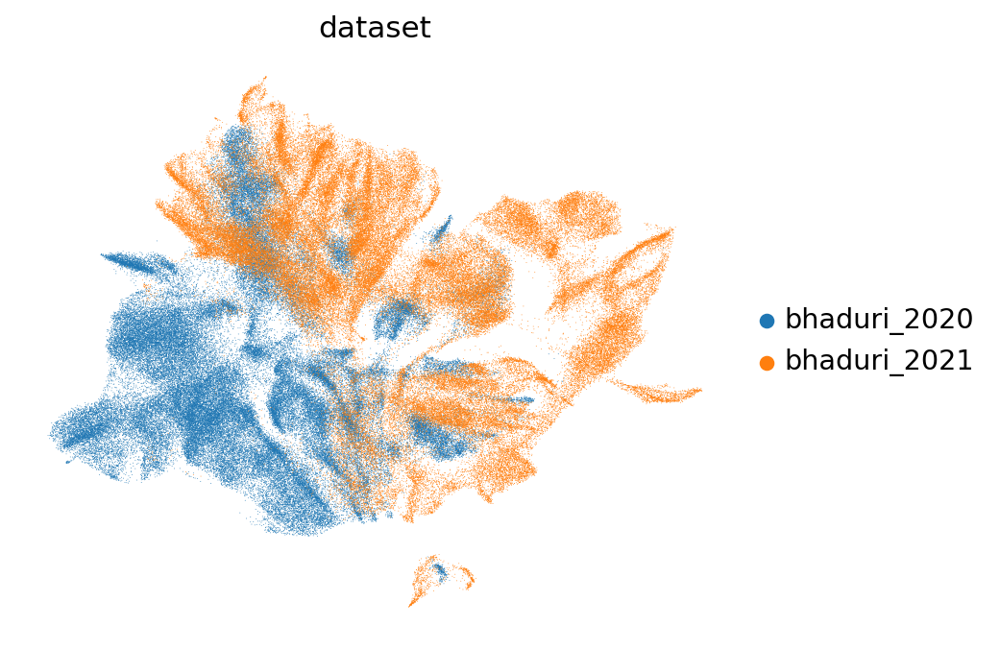

In [16]:
sc.pl.umap(adata, color='dataset', frameon=False, save='_dataset.png', show=True)

### 9b — UMAP colored by Leiden cluster

Cluster geography. We assign cell types in colab_09 (next notebook).

/tmp/ipykernel_16374/2406160928.py:1: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.umap(adata, color='leiden', legend_loc='on data', frameon=False, save='_leiden.png', show=True)


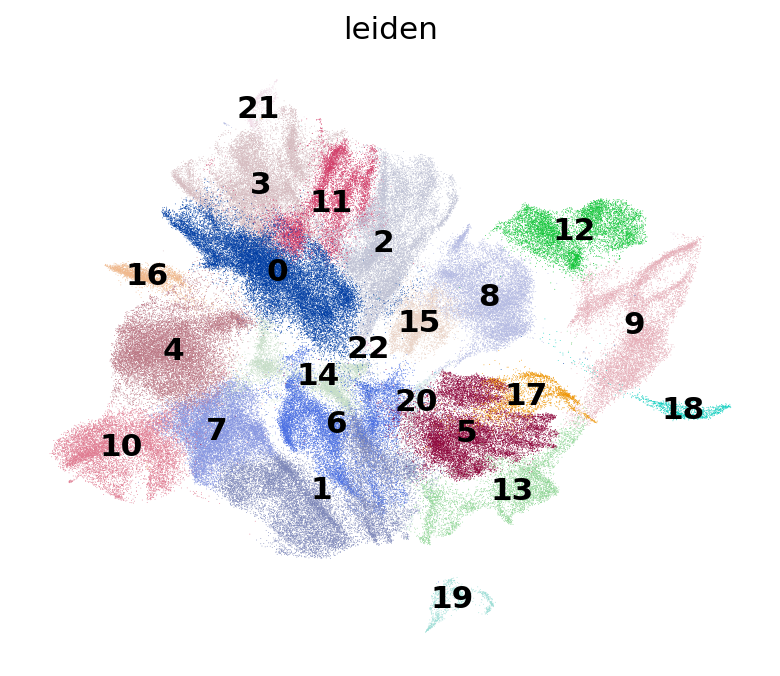

In [17]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', frameon=False, save='_leiden.png', show=True)

### 9c — Lineage marker genes

Sanity-check that markers land in expected regions:
- **SOX2**, **PAX6** — radial glia
- **EOMES** — intermediate progenitors
- **TBR1**, **NEUROD2** — excitatory neurons
- **GAD1**, **GAD2** — GABAergic interneurons
- **GFAP** — astrocytes
- **MKI67** — cycling cells

Scattered/diffuse markers → over-integration. `use_raw=True` reads from the full 16,768-gene `.raw` matrix, not the 2,000-HVG `.X`.

**Two outputs per marker run:**
1. A combined 3×3 grid panel (`_markers.png`) — good for at-a-glance comparison.
2. Individual full-size plots per gene (`_marker_<GENE>.png`) — needed for accurate per-gene spatial reads. The grid panels compress to thumbnails when reviewed; individual plots preserve resolution and make it possible to verify exactly where each marker localizes.

/tmp/ipykernel_16374/280937623.py:8: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.umap(adata, color=present, use_raw=True, ncols=3, frameon=False,


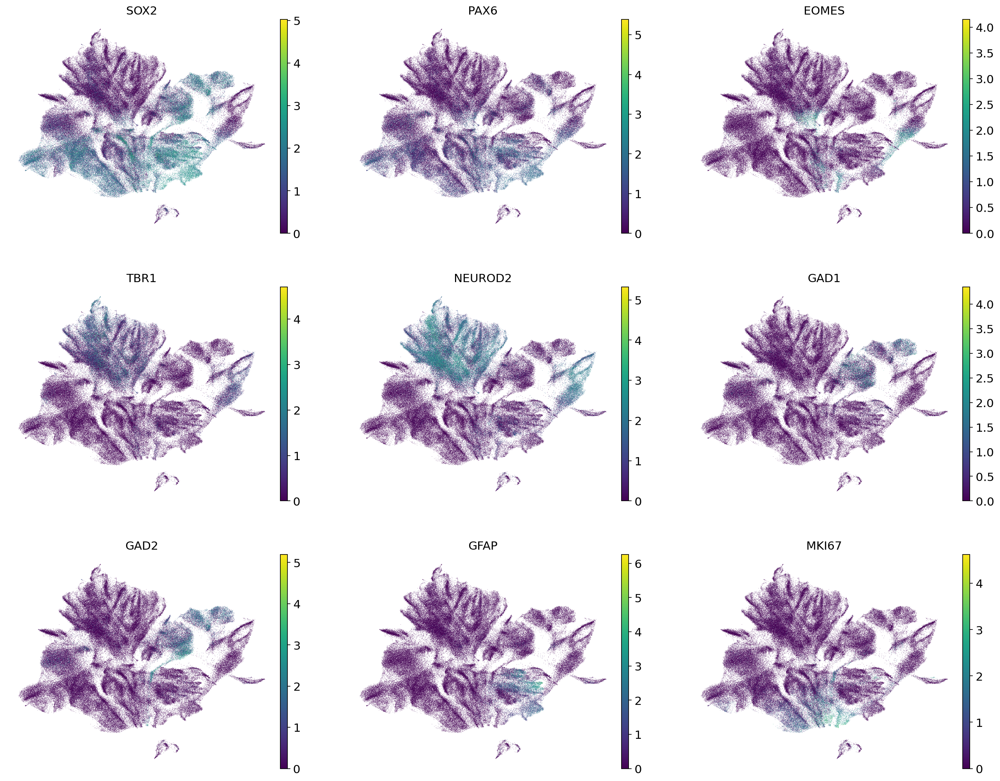

/tmp/ipykernel_16374/280937623.py:13: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.umap(adata, color=gene, use_raw=True, frameon=False, size=8,


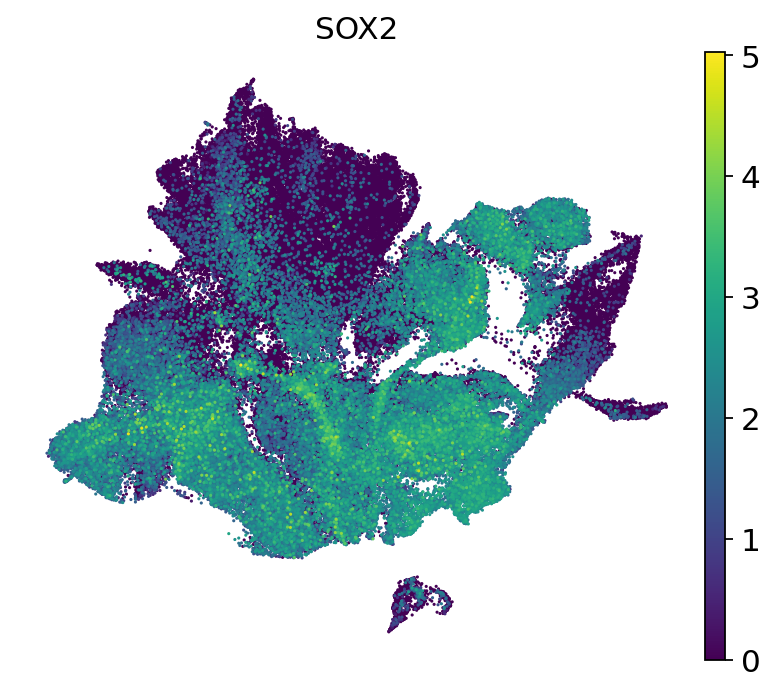

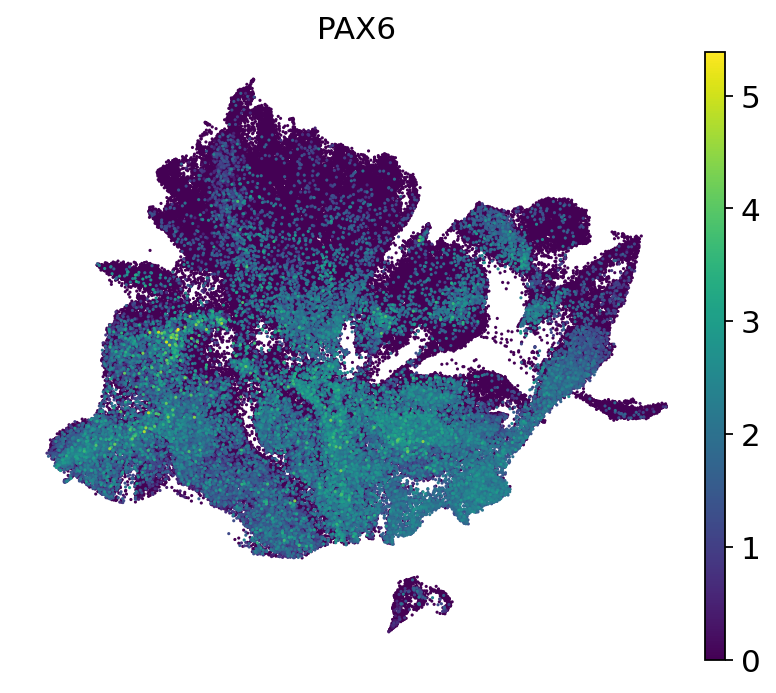

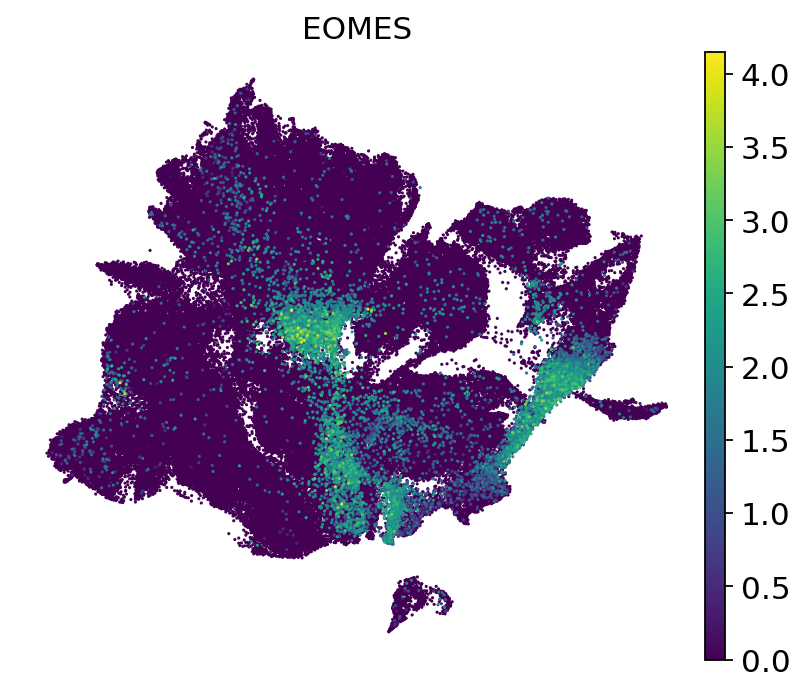

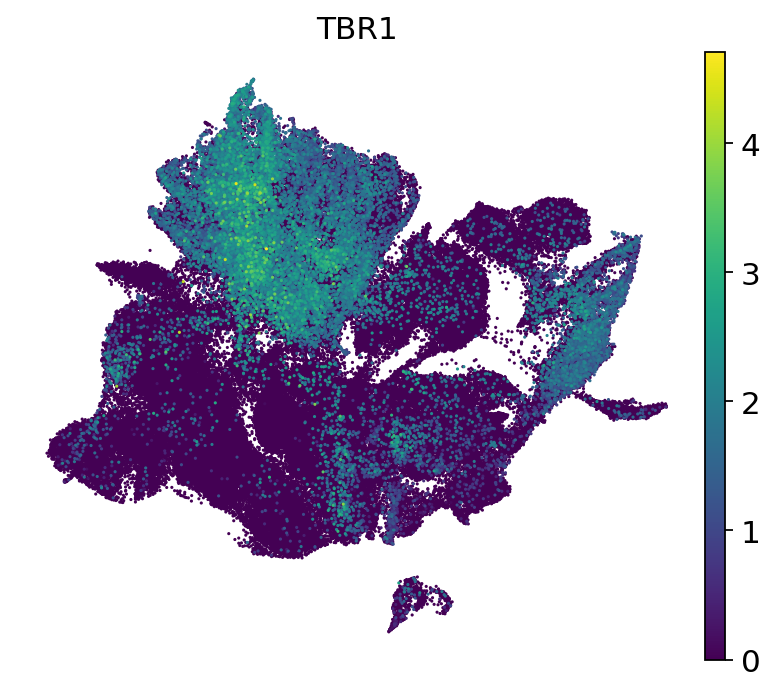

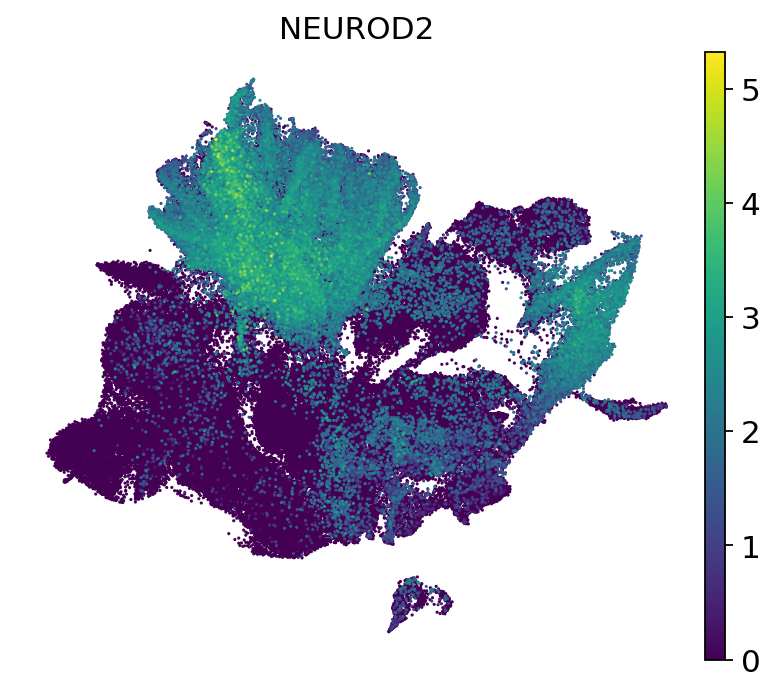

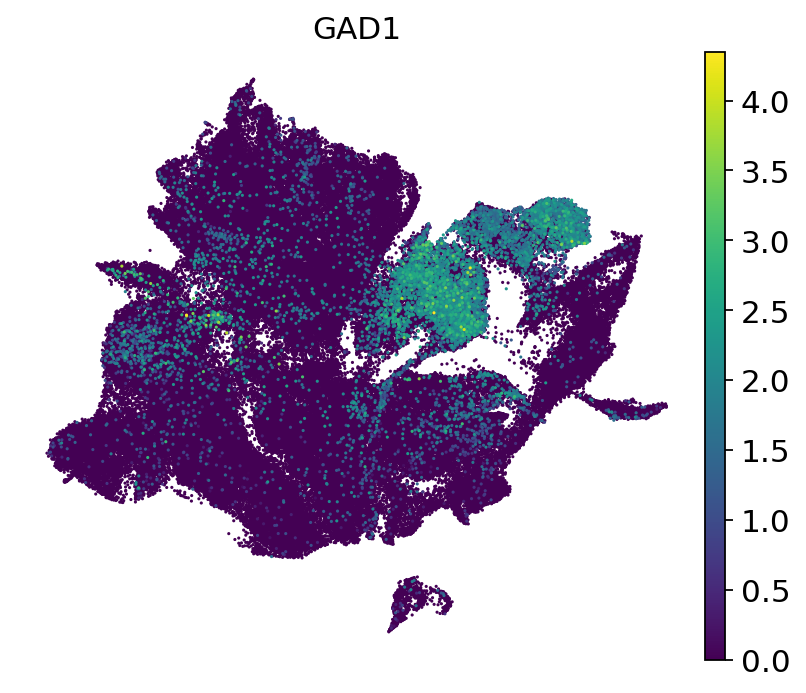

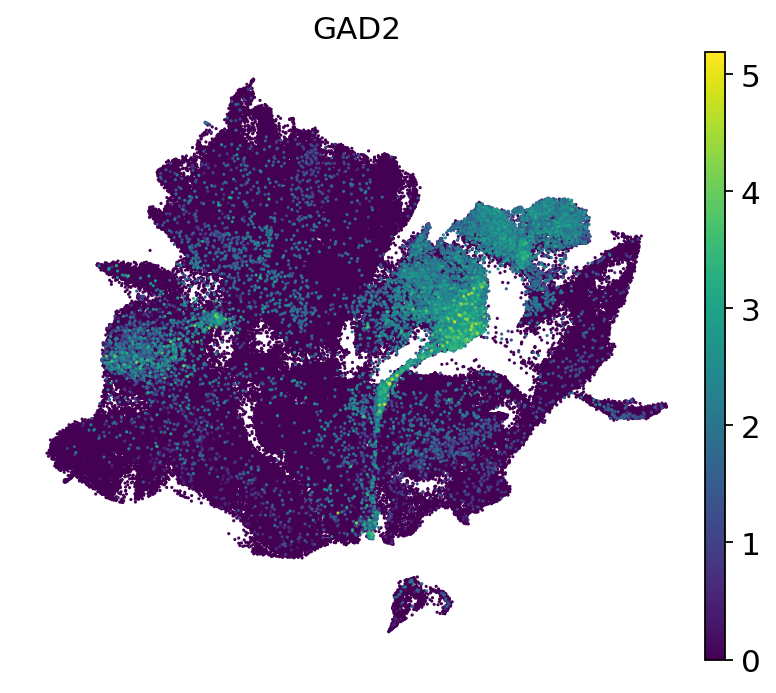

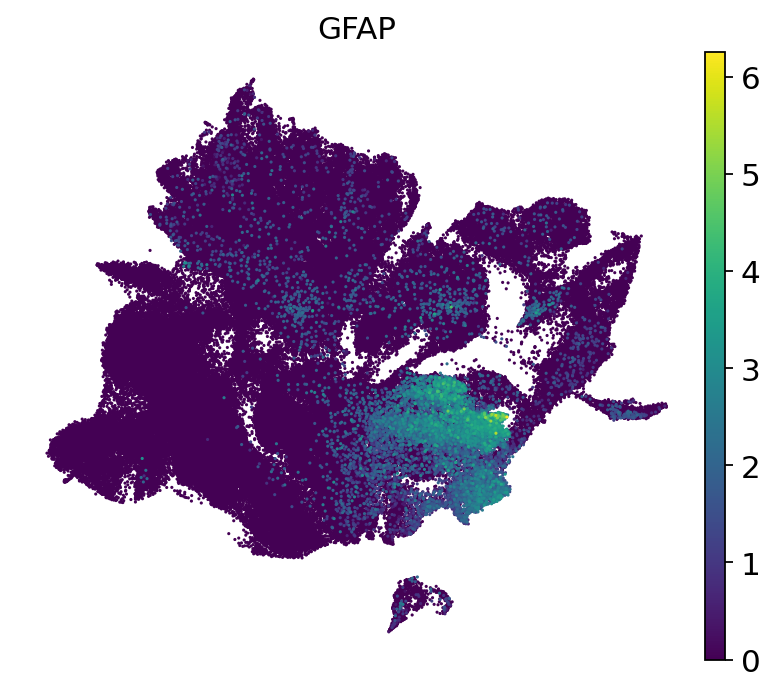

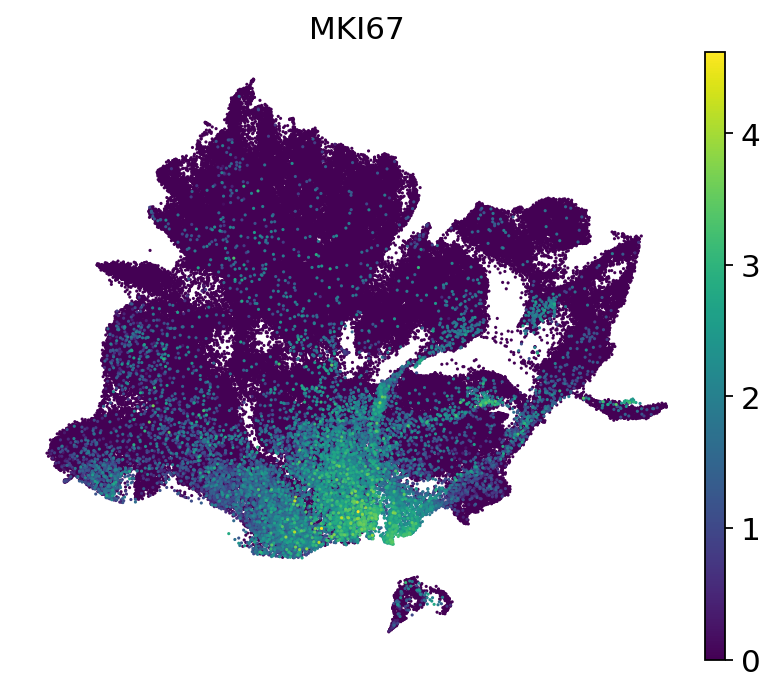

In [18]:
markers = ['SOX2', 'PAX6', 'EOMES', 'TBR1', 'NEUROD2', 'GAD1', 'GAD2', 'GFAP', 'MKI67']
present = [g for g in markers if g in adata.raw.var_names]
missing = [g for g in markers if g not in adata.raw.var_names]
if missing:
    print(f'Markers missing from .raw: {missing}')

# combined grid — good for at-a-glance comparison
sc.pl.umap(adata, color=present, use_raw=True, ncols=3, frameon=False,
           save='_markers.png', show=True)

# individual full-size plots — needed for accurate per-gene interpretation
for gene in present:
    sc.pl.umap(adata, color=gene, use_raw=True, frameon=False, size=8,
               save=f'_marker_{gene}.png', show=True)

### 9d — Cluster × dataset composition

Percentage of each dataset within each Leiden cluster. Values near 50/50 mean Harmony mixed that cluster well; clusters > 95% one dataset are candidates for batch artifacts — unlike the colab_03 Zhong run, both Bhaduri datasets should largely overlap, so heavily skewed clusters here would be more concerning than in colab_03.

In [19]:
comp = pd.crosstab(adata.obs['leiden'], adata.obs['dataset'], normalize='index') * 100
comp = comp.round(1)
comp['total_cells'] = adata.obs['leiden'].value_counts().sort_index().values
print(comp)

dataset  bhaduri_2020  bhaduri_2021  total_cells
leiden                                          
0                31.2          68.8        23973
1                83.6          16.4        17576
2                13.4          86.6        15593
3                49.4          50.6        15477
4                98.8           1.2        15407
5                39.9          60.1        13826
6                88.9          11.1        13197
7                99.9           0.1        13058
8                15.4          84.6        11620
9                 0.2          99.8        10762
10               99.6           0.4         9754
11                2.7          97.3         8782
12                0.1          99.9         7155
13                0.5          99.5         5130
14               95.2           4.8         5036
15               63.9          36.1         4360
16               99.2           0.8         2712
17                1.9          98.1         2674
18                0.

## 10. Save integrated object

### 10a — Write `integrated_100k_harmony_theta4.h5ad` to Drive

Stored alongside colab_08's output (`integrated_100k_harmony.h5ad`) and colab_08b's output (`integrated_100k_harmony_intersectHVG.h5ad`) for direct comparison. Predicted size: ca. 6–7 GB (same shape as colab_08, only the embedding values differ).

In [20]:
adata.write_h5ad(PATHS['integrated_out'])
size_gb = os.path.getsize(PATHS['integrated_out']) / 1e9
print(f'Saved: {PATHS["integrated_out"]}')
print(f'Size:  {size_gb:.2f} GB')
print(f'Final shape: {adata.shape}')

Saved: /content/drive/MyDrive/brain-organoid-trajectories/data/processed/integrated/integrated_100k_harmony_theta4.h5ad
Size:  5.57 GB
Final shape: (200000, 2000)


## 11. Cluster-0 RG remediation check

### 11a — Find the dominant RG cluster

Identify which cluster has the largest organoid PAX6⁺ SOX2⁺ MKI67⁺ RG signature in the new clustering. We look at the cluster with the most Bhaduri 2020 cells in the cortical-RG marker zone — proxied here by mean PAX6 + SOX2 + MKI67 expression per cluster, taken on `.raw` (full-gene log-normalized).

In [21]:
rg_markers_check = ['PAX6', 'SOX2', 'MKI67', 'VIM', 'NES', 'FABP7']
rg_idx = [adata.raw.var_names.get_loc(g) for g in rg_markers_check if g in adata.raw.var_names]
rg_score_per_cell = adata.raw.X[:, rg_idx]
if hasattr(rg_score_per_cell, 'toarray'):
    rg_score_per_cell = rg_score_per_cell.toarray()
rg_score_per_cell = rg_score_per_cell.mean(axis=1)

import pandas as pd
df = pd.DataFrame({
    'leiden':     adata.obs['leiden'].values,
    'rg_score':   rg_score_per_cell,
    'dataset':    adata.obs['dataset'].values,
})
cluster_rg = df.groupby('leiden')['rg_score'].mean().sort_values(ascending=False)
print('Top 5 clusters by mean RG-marker score:')
print(cluster_rg.head().round(3).to_string())

rg_cluster = cluster_rg.index[0]
print(f'\nDominant RG cluster: {rg_cluster}')
print(df[df['leiden']==rg_cluster]['dataset'].value_counts().to_string())

Top 5 clusters by mean RG-marker score:
leiden
13    1.985
5     1.424
17    1.070
1     1.051
22    0.995

Dominant RG cluster: 13
dataset
bhaduri_2021    5102
bhaduri_2020      28


/tmp/ipykernel_16374/628368842.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_rg = df.groupby('leiden')['rg_score'].mean().sort_values(ascending=False)


### 11b — Fetal cell_type_coarse enrichment in the dominant RG cluster

Same diagnostic as colab_09 1d, applied to the new dominant RG cluster. **Pass criterion** for intersection-HVG remediation:
- Fetal cell count in dominant RG cluster substantially higher than colab_08's 298 (target: ≳ a few thousand, since ca. 11,200 fetal RG should distribute toward this cluster if mixing works).
- Fraction of all 2020 cells in this cluster ≈ fraction of all 2021 RG in this cluster (similar absolute mixing).
- RG enrichment ratio in the fetal contingent stays high (≳ 5×) — confirms it's still an RG cluster, not a degenerated mixed cluster.

If both fetal count and RG enrichment hold up, intersection HVGs fixed it. If fetal count is still ca. 300, escalate to Harmony `theta`.

In [22]:
mask_rg     = (adata.obs['leiden'] == rg_cluster).values
mask_2021   = (adata.obs['dataset'] == 'bhaduri_2021').values
mask_2020   = (adata.obs['dataset'] == 'bhaduri_2020').values
mask_in_2021 = mask_rg & mask_2021
mask_in_2020 = mask_rg & mask_2020

print(f'Cluster {rg_cluster} composition:')
print(f'  bhaduri_2020: {mask_in_2020.sum():,} cells '
      f'(= {mask_in_2020.sum() / mask_2020.sum() * 100:.1f}% of all 2020)')
print(f'  bhaduri_2021: {mask_in_2021.sum():,} cells '
      f'(= {mask_in_2021.sum() / mask_2021.sum() * 100:.1f}% of all 2021)')
print(f'  colab_08 cluster 0 had: 23,439 / 298   (23.4% of 2020 / 0.3% of 2021)')
print()

baseline   = adata.obs.loc[mask_2021,    'cell_type_coarse'].value_counts(normalize=True)
in_cluster = adata.obs.loc[mask_in_2021, 'cell_type_coarse'].value_counts(normalize=True)
enrichment = (in_cluster / baseline).sort_values(ascending=False)

print(f'Bhaduri 2021 baseline cell_type_coarse (n = {mask_2021.sum():,}):')
print(baseline.round(3).to_string())
print()
print(f'Cluster {rg_cluster} — Bhaduri 2021 cells only (n = {mask_in_2021.sum():,}):')
print(in_cluster.round(3).to_string())
print()
print(f'Enrichment ratio (>1 = enriched):')
print(enrichment.round(2).to_string())

Cluster 13 composition:
  bhaduri_2020: 28 cells (= 0.0% of all 2020)
  bhaduri_2021: 5,102 cells (= 5.1% of all 2021)
  colab_08 cluster 0 had: 23,439 / 298   (23.4% of 2020 / 0.3% of 2021)

Bhaduri 2021 baseline cell_type_coarse (n = 100,000):
cell_type_coarse
Neuron         0.524
Interneuron    0.174
RG             0.112
Dividing       0.093
IPC            0.039
Microglia      0.028
OPC            0.021
Vascular       0.009

Cluster 13 — Bhaduri 2021 cells only (n = 5,102):
cell_type_coarse
RG             0.509
Dividing       0.448
IPC            0.020
Interneuron    0.017
Microglia      0.002
OPC            0.001
Neuron         0.001
Vascular       0.001

Enrichment ratio (>1 = enriched):
cell_type_coarse
Dividing       4.83
RG             4.53
IPC            0.51
Interneuron    0.10
Microglia      0.08
Vascular       0.07
OPC            0.06
Neuron         0.00


### 11c — Verdict and routing

Decision rule:
- **Pass** (fetal RG count ≳ several thousand AND RG enrichment ≳ 5× AND ca. 41% pure-cluster fraction drops substantially) → intersection HVGs fixed it. Proceed to colab_10 (full annotation) on this h5ad.
- **Partial** (fetal count up but still skewed, or pure-cluster fraction only modestly improved) → escalate to Harmony `theta=4` (or higher). Add as section 12 here, or fork colab_08c.
- **Fail** (fetal count still ca. 300, dominant RG cluster still 98%+ organoid-pure) → switch to scVI. Fork colab_08d using the scvi-tools workflow.

In [23]:
# Summary print
n_pure_2020 = sum(1 for cl in adata.obs['leiden'].unique()
                  if (adata.obs.loc[adata.obs['leiden']==cl, 'dataset']=='bhaduri_2020').mean() > 0.95)
n_pure_2021 = sum(1 for cl in adata.obs['leiden'].unique()
                  if (adata.obs.loc[adata.obs['leiden']==cl, 'dataset']=='bhaduri_2021').mean() > 0.95)
total_pure_cells = sum(
    (adata.obs['leiden']==cl).sum()
    for cl in adata.obs['leiden'].unique()
    if (adata.obs.loc[adata.obs['leiden']==cl, 'dataset']=='bhaduri_2020').mean() > 0.95
    or (adata.obs.loc[adata.obs['leiden']==cl, 'dataset']=='bhaduri_2021').mean() > 0.95
)

print('=' * 70)
print('REMEDIATION SUMMARY — intersection HVGs')
print('=' * 70)
print(f'HVG count:                        {adata.shape[1]:,}  (vs colab_08\'s 2,000)')
print(f'Leiden clusters:                  {adata.obs["leiden"].nunique()}  (vs colab_08\'s 21)')
print(f'>95%-pure clusters: 2020={n_pure_2020}, 2021={n_pure_2021}')
print(f'Cells in >95%-pure clusters:      {total_pure_cells:,} '
      f'({total_pure_cells/len(adata)*100:.0f}%)  (vs colab_08\'s ca. 41%)')
print(f'Dominant RG cluster:              {rg_cluster}')
print(f'  fetal cells in RG cluster:      {mask_in_2021.sum():,}  (vs colab_08\'s 298)')
print(f'  fetal RG enrichment:            {enrichment.get("RG", 0):.2f}x  (vs colab_08\'s 6.66x)')
print('=' * 70)

REMEDIATION SUMMARY — intersection HVGs
HVG count:                        2,000  (vs colab_08's 2,000)
Leiden clusters:                  23  (vs colab_08's 21)
>95%-pure clusters: 2020=5, 2021=8
Cells in >95%-pure clusters:      82,501 (41%)  (vs colab_08's ca. 41%)
Dominant RG cluster:              13
  fetal cells in RG cluster:      5,102  (vs colab_08's 298)
  fetal RG enrichment:            4.53x  (vs colab_08's 6.66x)
